In [56]:
import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
from ydata_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [41]:
df = pd.read_csv('./results/time/res_test.csv', sep=';')
df

,sg_1,sg_2,sg_3,sg_4,sg_5,t_1,t_2,t_3,t_4,t_5,...,t_1741,t_1742,t_1743,t_1744,t_1745,t_1746,t_1747,t_1748,t_1749,t_1750
0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-84.938158,-80.728397,-75.861386,-72.277455,-70.994025,-71.219981,-71.123196,-69.473793,-66.587240,-63.777362
1,0.0000,0.0000,0.1571,0.1885,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-112.328733,-114.723839,-118.093773,-122.406680,-127.449837,-132.838713,-138.030000,-142.385585,-145.326264,-146.547272
2,0.0628,0.1885,0.0000,0.0000,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-215.925760,-208.148882,-201.003233,-193.882880,-185.818616,-176.021697,-164.344183,-151.415210,-138.394574,-126.502069
3,0.0000,0.0000,0.1571,0.0000,0.0628,-0.0,0.0,-0.0,0.0,-0.0,...,-78.134599,-80.118847,-81.620431,-82.612570,-82.925699,-82.105422,-79.391445,-73.957469,-65.373726,-54.051958
4,0.0000,0.0000,0.0000,0.0628,0.1885,-0.0,0.0,-0.0,0.0,-0.0,...,-39.244195,-37.137821,-36.046526,-35.865025,-36.082599,-36.153029,-35.861219,-35.419372,-35.248102,-35.626613
5,0.0000,0.0628,0.0000,0.0000,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-70.560379,-66.945874,-62.556403,-58.622008,-55.509044,-52.741788,-49.599146,-45.857362,-42.132162,-39.554095
6,0.0000,0.0000,0.0000,0.0000,0.2513,-0.0,0.0,-0.0,0.0,-0.0,...,-144.410166,-144.360904,-145.937005,-147.803955,-148.357136,-146.585786,-142.700548,-138.089939,-134.584778,-133.455121
7,0.0000,0.0314,0.1257,0.0000,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-85.729437,-83.160495,-80.277383,-76.994454,-73.731631,-71.437704,-71.192216,-73.593515,-78.308869,-84.096916
8,0.0000,0.0000,0.0000,0.0000,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-84.938158,-80.728397,-75.861386,-72.277455,-70.994025,-71.219981,-71.123196,-69.473793,-66.587240,-63.777362
9,0.0000,0.2827,0.0000,0.0314,0.0000,-0.0,0.0,-0.0,0.0,-0.0,...,-107.433993,-109.415470,-112.770734,-117.687209,-123.427786,-128.731785,-132.505002,-134.388764,-134.896343,-135.087859


In [42]:
# np.mean(df.iloc[0, 5:-2].values.reshape(-1, 4), axis=1)

<AxesSubplot: >

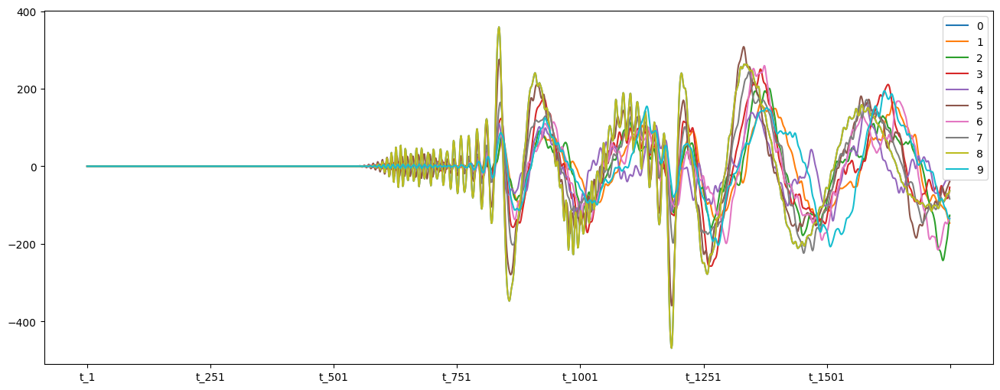

In [43]:
fig, ax = plt.subplots(figsize=(16, 6))

df.iloc[:, 5:].T.plot(ax=ax)
# ax.axvline(x=168 * 4, color='r')
# ax.axvline(x=204 * 4, color='r')
# ax.axvline(x=223 * 4, color='r')
# ax.axvline(x=243 * 4, color='r')
# ax.axvline(x=280 * 4, color='r')
# ax.axvline(x=325 * 4, color='r')
# ax.axvline(x=360 * 4, color='r')
# ax.axvline(x=420 * 4, color='r')

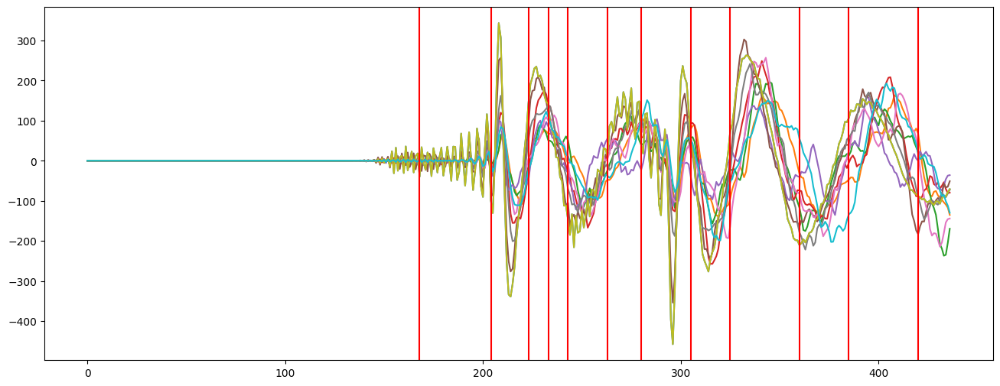

In [50]:
fig, ax = plt.subplots(figsize=(16, 6))

means = []
for i in range(10):
    means.append(np.mean(df.iloc[i, 5:-2].values.reshape(-1, 4), axis=1))
# mean_values = np.mean(df.iloc[:, 5:-2].values.reshape(10, (-1, 4)), axis=1).T
means = np.array(means).T
_ = ax.plot(means)
ax.axvline(x=168, color='r')
ax.axvline(x=204, color='r')
ax.axvline(x=223, color='r')
ax.axvline(x=233, color='r')
ax.axvline(x=243, color='r')
ax.axvline(x=263, color='r')
ax.axvline(x=280, color='r')
ax.axvline(x=305, color='r')
ax.axvline(x=325, color='r')
ax.axvline(x=360, color='r')
ax.axvline(x=385, color='r')
ax.axvline(x=420, color='r')

## Small analysis

In [73]:
df_raw = pd.read_csv('./results/time/res_air_s5_1000.csv', delimiter=';')
df_raw.iloc[:, :5] = df_raw.iloc[:, :5] > 0.075 # can be [0.0, 0.05, 0.075, 0.1, 0.15, 0.2]
df_raw.drop_duplicates(subset=df_raw.columns, inplace=True)

# select the rows with only one True value
df_raw = df_raw[df_raw.iloc[:, :5].sum(axis=1) == 1]
df_raw

,sg_1,sg_2,sg_3,sg_4,sg_5,t_1,t_2,t_3,t_4,t_5,t_6,t_7,t_8,t_9,t_10,t_11,t_12
2,False,True,False,False,False,4.919479,-5.569943,-15.008852,51.157952,51.398306,-23.396691,39.818442,55.880976,-22.588466,-117.159440,13.203171,22.324917
3,False,False,True,False,False,5.350050,-30.629738,-20.392770,138.997735,-32.211030,24.598524,57.745205,93.376199,-53.776324,-74.203311,-4.705125,-88.095297
4,False,False,False,False,True,1.299697,-11.026162,-48.850831,85.891404,-29.486711,55.969424,-22.523916,-37.185687,7.685894,-40.440237,25.247142,-0.213099
6,False,False,False,False,True,-1.197109,-10.687448,5.197341,100.827702,-5.608294,5.320993,89.048153,18.149977,-163.581611,-81.440123,22.699204,26.680922
7,False,False,True,False,False,6.120358,-32.683347,52.062548,137.340453,-70.326232,-7.449660,114.707869,58.949208,-24.887276,-178.491346,58.471747,-91.133374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989,False,False,False,False,True,3.874659,9.678739,8.027673,20.845701,-20.624933,-66.144924,143.341464,39.429572,22.612134,-26.285185,50.302913,-82.338497
990,True,False,False,False,False,7.489463,-48.651864,15.112047,144.637436,-53.471909,-3.661835,96.579402,-21.011388,-79.667012,-129.478434,1.757669,19.797322
992,False,False,False,False,True,-2.856757,-26.292745,89.936228,37.225098,-71.272676,-39.972773,101.241446,75.171526,-34.664390,-59.545730,18.955023,27.396779
993,False,False,True,False,False,-0.575553,-6.055837,-19.221990,149.749581,4.356966,-60.811598,119.140628,70.067147,-70.500245,-116.931911,60.976589,-139.067428


In [74]:
df_raw.describe().T

,count,mean,std,min,25%,50%,75%,max
t_1,389.0,-0.511387,5.863877,-22.866571,-4.074249,-0.896885,2.785187,19.473902
t_2,389.0,-21.750130,23.144480,-106.919559,-35.021469,-18.320992,-4.821108,23.979353
t_3,389.0,7.662051,42.804438,-118.540395,-24.642928,8.381357,39.113919,121.136593
t_4,389.0,118.539195,36.625372,12.191429,97.790889,122.575619,141.715428,217.824603
t_5,389.0,-34.638088,45.838826,-172.373186,-66.062122,-32.211030,-2.573645,96.291857
t_6,389.0,-28.499434,38.856329,-155.685789,-52.906245,-27.282328,-4.374779,108.141436
t_7,389.0,99.294779,39.786924,-29.067220,74.889637,101.726678,125.213929,223.602255
t_8,389.0,31.033886,46.627832,-147.311049,1.369459,33.008208,62.496742,167.416212
t_9,389.0,-37.970355,57.461119,-277.069900,-68.926533,-36.578742,-0.808220,108.383493
t_10,389.0,-141.547200,60.975290,-309.645445,-182.043173,-147.276489,-100.272945,92.796991


In [75]:
scaler = StandardScaler()
# scaler = MinMaxScaler()
df = df_raw
df.iloc[:, 5:] = scaler.fit_transform(df.iloc[:,5:].to_numpy())
df

,sg_1,sg_2,sg_3,sg_4,sg_5,t_1,t_2,t_3,t_4,t_5,t_6,t_7,t_8,t_9,t_10,t_11,t_12
2,False,True,False,False,False,0.927349,0.699995,-0.530321,-1.842111,1.879350,0.131492,-1.496797,0.533567,0.268037,0.400476,-0.442810,1.425475
3,False,False,True,False,False,1.000871,-0.384154,-0.656263,0.559309,0.053016,1.368280,-1.045647,1.338741,-0.275427,1.105868,-0.755591,-0.398300
4,False,False,False,False,True,0.309252,0.463946,-1.321958,-0.892546,0.112525,2.176676,-3.065720,-1.464950,0.795582,1.660298,-0.232454,1.053222
6,False,False,False,False,True,-0.117091,0.478599,-0.057655,-0.484208,0.634117,0.871518,-0.257869,-0.276670,-2.188837,0.987031,-0.276956,1.497421
7,False,False,True,False,False,1.132405,-0.472998,1.038623,0.514001,-0.779560,0.542431,0.387890,0.599455,0.227979,-0.606667,0.347836,-0.448479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989,False,False,False,False,True,0.748940,1.359691,0.008553,-2.670807,0.306099,-0.970086,1.108490,0.180289,1.055679,1.892741,0.205162,-0.303217
990,True,False,False,False,False,1.366187,-1.163836,0.174271,0.713490,-0.411400,0.640040,-0.068336,-1.117622,-0.726584,0.198184,-0.642714,1.383727
992,False,False,False,False,True,-0.400484,-0.196525,1.924570,-2.223017,-0.800234,-0.295656,0.048990,0.947813,0.057608,1.346563,-0.342350,1.509245
993,False,False,True,False,False,-0.010957,0.678974,-0.628876,0.853249,0.851795,-0.832651,0.499446,0.838202,-0.566849,0.404213,0.391585,-1.240190


In [76]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
t_1,389.0,-3.424853e-17,1.001288,-3.817265,-0.608377,-0.065826,0.562907,3.412593
t_2,389.0,-1.369941e-16,1.001288,-3.684642,-0.574151,0.148353,0.732392,1.978371
t_3,389.0,0.000000e+00,1.001288,-2.952147,-0.755683,0.016826,0.735727,2.654413
t_4,389.0,3.379188e-16,1.001288,-2.907403,-0.567230,0.110350,0.633607,2.714328
t_5,389.0,1.712426e-17,1.001288,-3.008639,-0.686416,0.053016,0.700405,2.859989
t_6,389.0,7.192190e-17,1.001288,-3.277462,-0.628939,0.031364,0.621668,3.521095
t_7,389.0,3.424853e-17,1.001288,-3.230391,-0.614186,0.061202,0.652288,3.128353
t_8,389.0,8.333808e-17,1.001288,-3.829786,-0.637015,0.042397,0.675635,2.928679
t_9,389.0,4.566470e-18,1.001288,-4.166425,-0.539426,0.024250,0.647568,2.550287
t_10,389.0,-2.169073e-16,1.001288,-2.760376,-0.664993,-0.094082,0.677773,3.848214


In [77]:
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]